# Importing Libraries

In [ ]:
pip install pYIN

  Preparing metadata (setup.py) ... done
  Created wheel for pYIN: filename=pyin-0.5.4-py3-none-any.whl size=8724 sha256=a7ad6d6dd448cc2ce1f0529b63e3a439945b6bd5d77a396b07dae07c55b73479
  Stored in directory: /root/.cache/pip/wheels/92/14/fc/0b73ad6a29cd67123f5b461c7f67a806a8371da88ae248fc40
Successfully built pYIN


In [ ]:
pip install pyworld

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 252.0/252.0 kB 4.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pyworld: filename=pyworld-0.3.4-cp310-cp310-linux_x86_64.whl size=865327 sha256=1eb8de04d144d295ede84a5589e96b9b369c60c9d3bd9ffb2dc7d0ef3d644612
  Stored in directory: /root/.cache/pip/wheels/66/09/8a/a1d79b73d59756f66e9bfe55a199840efc7473adb76ddacdfd
Successfully built pyworld


In [ ]:
pip install librosa

In [ ]:
from scipy.io import wavfile
import numpy as np
import pylab as pl
from sklearn.decomposition import FastICA
from IPython.display import Audio
import librosa
import matplotlib.pyplot as plt
import wave
from scipy.io.wavfile import write
import soundfile as sf  # for playing the audio

**Find all the audio files at https://github.com/Sharry13/Audio-Signal-Processing-with-Independent-Component-Analysis-ICA-/tree/main**

In [ ]:
fs_1, voice_1 = wavfile.read("mix_type_2_1.wav")
fs_2, voice_2 = wavfile.read("mix_type_1_2.wav")

In [ ]:
Audio(data=voice_1, rate=fs_1)

In [ ]:
Audio(data=voice_2, rate=fs_2)

In [ ]:
m, = voice_1.shape
voice_2 = voice_2[:m]

In [ ]:
# Pad the shorter array with zeros
if len(voice_1) < len(voice_2):
    voice_1 = np.pad(voice_1, (0, len(voice_2) - len(voice_1)), 'constant')
else:
    voice_2 = np.pad(voice_2, (0, len(voice_1) - len(voice_2)), 'constant')

# Concatenate the arrays
S = np.c_[voice_1, voice_2]

In [ ]:
S = np.c_[voice_1, voice_2]
A = np.array([[1, 1], [0.5, 2]])  # Mixing matrix
X = np.dot(S, A.T)  # Generate observations

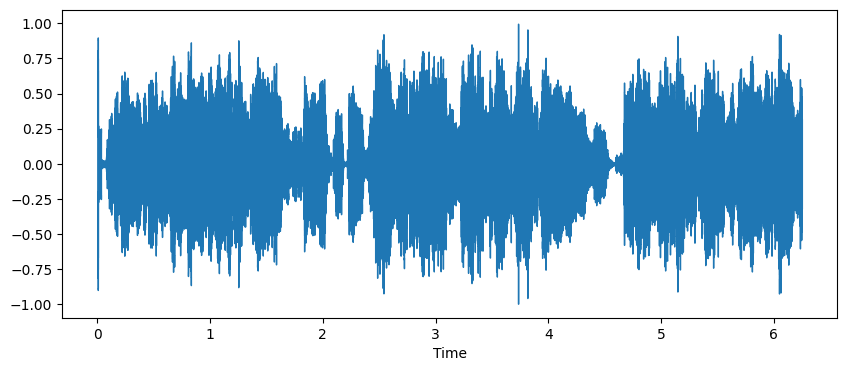

In [ ]:
# Load the audio file
audio_file_path = 'mix_type_1_2.wav'
audio_signal, sampling_rate = librosa.load(audio_file_path)

# Plot the waveform
plt.figure(figsize=(10, 4))
librosa.display.waveshow(audio_signal, sr=sampling_rate)

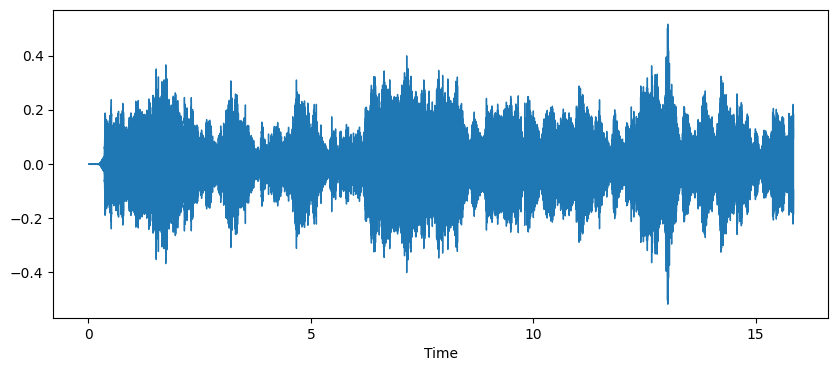

In [ ]:
audio_signal2, sampling_rate = librosa.load('mix_type_2_1.wav')
# Plot the waveform
plt.figure(figsize=(10, 4))
librosa.display.waveshow(audio_signal2, sr=sampling_rate)

<Figure size 1000x400 with 0 Axes>

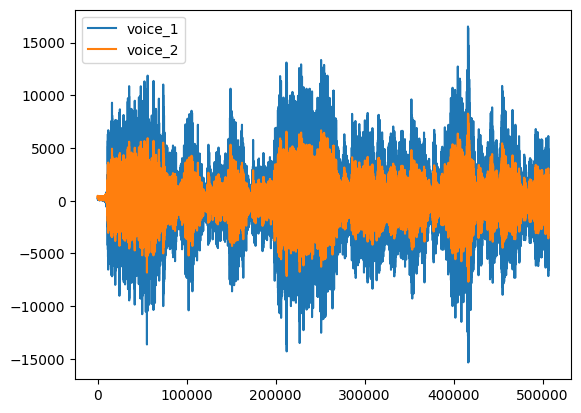

In [ ]:
# prompt: display the mixed audio that u concatenated above
pl.figure(figsize=(10, 4))
pl.figure()
pl.plot(X[:, 0])
pl.plot(X[:, 1])
pl.legend(['voice_1', 'voice_2'])
pl.show()

In [ ]:
# Convert the mixed audio to a WAV file
wavfile.write("mixed_audio.wav", fs_1, X.astype(np.int16))

# Play the mixed audio
Audio("mixed_audio.wav")

## **APPLYING ICA**

In [ ]:
# Compute ICA
ica = FastICA()
S_ = ica.fit(X).transform(X)  # Get the estimated sources
A_ = ica.mixing_  # Get estimated mixing matrix
np.allclose(X, np.dot(S_, A_.T))

/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


False

In [ ]:
multiply_factor = 1000000 ;

In [ ]:
temp_output_1 = multiply_factor*S_[:,0]
temp_output_2 = multiply_factor*S_[:,1]

wavfile.write("Seperated_1a.wav", fs_2, temp_output_1.astype(np.int16))
wavfile.write("Seperated_2b.wav", fs_2, temp_output_2.astype(np.int16))

In [ ]:
# Play the mixed audio
Audio("Seperated_1a.wav")

In [ ]:
# Play the mixed audio
Audio("Seperated_2b.wav")

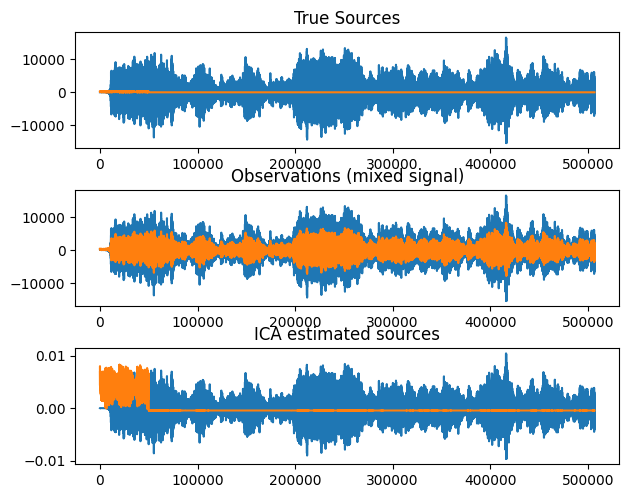

In [ ]:
# Plot results
pl.figure()
pl.subplot(3, 1, 1)
pl.plot(S)
pl.title('True Sources')
pl.subplot(3, 1, 2)
pl.plot(X)
pl.title('Observations (mixed signal)')
pl.subplot(3, 1, 3)
pl.plot(S_)
pl.title('ICA estimated sources')
pl.subplots_adjust(0.09, 0.04, 0.94, 0.94, 0.26, 0.36)
pl.show()

In [ ]:
# Calculate the signal-to-noise ratio (SNR) for each separated source
snr_1 = 10 * np.log10(np.mean(voice_1**2) / np.mean((voice_1 - S_[:, 0])**2))
snr_2 = 10 * np.log10(np.mean(voice_2**2) / np.mean((voice_2 - S_[:, 1])**2))

# Print the SNR values
print(f"SNR for separated source 1: {snr_1:.2f} dB")
print(f"SNR for separated source 2: {snr_2:.2f} dB")

# Calculate the correlation coefficient between each separated source and the ground truth
corr_1 = np.corrcoef(voice_1, S_[:, 0])[0, 1]
corr_2 = np.corrcoef(voice_2, S_[:, 1])[0, 1]

# Print the correlation coefficients
print(f"Correlation coefficient between separated source 1 and ground truth: {corr_1:.2f}")
print(f"Correlation coefficient between separated source 2 and ground truth: {corr_2:.2f}")


SNR for separated source 1: -40.93 dB
SNR for separated source 2: -22.76 dB
Correlation coefficient between separated source 1 and ground truth: 1.00
Correlation coefficient between separated source 2 and ground truth: 1.00


For "separated source 1," the signal-to-noise ratio is -40.93 decibels (dB).

A negative SNR value indicates that the noise level is higher than the signal level. In this case, it suggests that the noise is significantly louder or more dominant than the actual signal.

Similarly, for "separated source 2," the SNR is -22.76 dB, again indicating that the noise level is higher than the signal level, although to a lesser extent compared to the first source.

### both "separated source 1" and "separated source 2" have correlation coefficients of 1.00 with the ground truth. This means that there is a perfect positive linear relationship between each separated source and the ground truth.

In [ ]:
#signal to artfact ratio
import numpy as np
# Calculate the signal-to-artifact ratio (SAR) for each separated source
sar_1 = 10 * np.log10(np.mean(voice_1**2) / np.mean((voice_1 - S_[:, 0])**2 + (voice_2 - S_[:, 1])**2))
sar_2 = 10 * np.log10(np.mean(voice_2**2) / np.mean((voice_1 - S_[:, 0])**2 + (voice_2 - S_[:, 1])**2))

# Print the SAR values
print(f"SAR for separated source 1: {sar_1:.2f} dB")
print(f"SAR for separated source 2: {sar_2:.2f} dB")


SAR for separated source 1: -40.93 dB
SAR for separated source 2: -57.48 dB


In [ ]:
# prompt: evaluate SIR also

import numpy as np
# Calculate the signal-to-interference ratio (SIR) for each separated source
sir_1 = 10 * np.log10(np.mean(voice_1**2) / np.mean((voice_2 - S_[:, 1])**2))
sir_2 = 10 * np.log10(np.mean(voice_2**2) / np.mean((voice_1 - S_[:, 0])**2))

# Print the SIR values
print(f"SIR for separated source 1: {sir_1:.2f} dB")
print(f"SIR for separated source 2: {sir_2:.2f} dB")

SIR for separated source 1: -6.21 dB
SIR for separated source 2: -57.48 dB


FEATURE EXTRACTION ON PITCH, INTENSITY AND SOUND QUALITY

In [ ]:
print(S_.shape)

(506880, 2)


In [ ]:
sr = 22050  # Sample rate in Hz

## **CLUSTERING ON SEPERATED SOURCES**

In [ ]:
# prompt: apply clustering on the seperated sources such that music in 1 cluster and the human voice in another cluster

import numpy as np
from sklearn.cluster import KMeans

# Separate the sources
source_1 = S_[:, 0]
source_2 = S_[:, 1]

# Reshape the sources into 2D arrays
source_1 = source_1.reshape(-1, 1)
source_2 = source_2.reshape(-1, 1)

# Combine the sources into a single array
sources = np.concatenate((source_1, source_2), axis=1)

# Apply K-means clustering with 2 clusters
kmeans = KMeans(n_clusters=2)
kmeans.fit(sources)

# Get the cluster labels
labels = kmeans.labels_

# Separate the music and voice clusters
music = sources[labels == 0]
voice = sources[labels == 1]


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


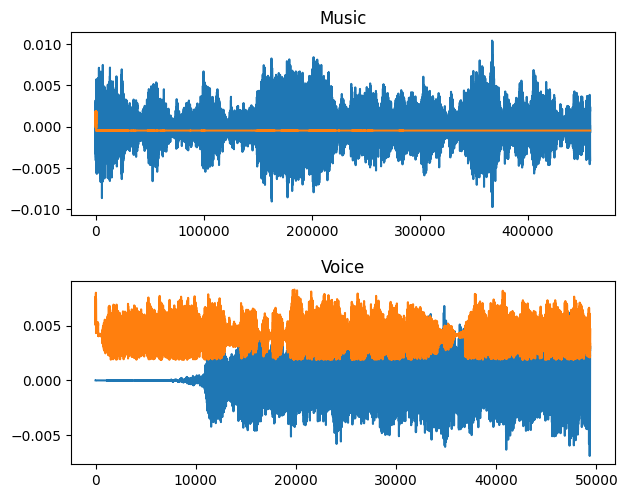

In [ ]:
# Plot the clusters
pl.figure()
pl.subplot(2, 1, 1)
pl.plot(music)
pl.title('Music')
pl.subplot(2, 1, 2)
pl.plot(voice)
pl.title('Voice')
pl.subplots_adjust(0.09, 0.04, 0.94, 0.94, 0.26, 0.36)
pl.show()

# **Part 2**

In [ ]:
mix_1_wave=wave.open('ICA mix 1.wav','r')
mix_1_wave.getparams()

_wave_params(nchannels=1, sampwidth=2, framerate=44100, nframes=264515, comptype='NONE', compname='not compressed')

In [ ]:
#so the length of the sound is
264515/44100

5.998072562358277

In [ ]:
#extract raw audio from wav file
signal_1_raw = mix_1_wave.readframes(-1)
signal_1 = np.fromstring(signal_1_raw, 'int16')

<ipython-input-40-ae7af16549c7>:3: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  signal_1 = np.fromstring(signal_1_raw, 'int16')


In [ ]:
signal_1

array([  879,  1268,  1460, ...,  9204,  9553, 10006], dtype=int16)

In [ ]:
len(signal_1)

264515

In [ ]:
fs=mix_1_wave.getframerate()

In [ ]:
len(signal_1)/fs

5.998072562358277

In [ ]:
timing = np.linspace(0, len(signal_1)/fs, num=len(signal_1))

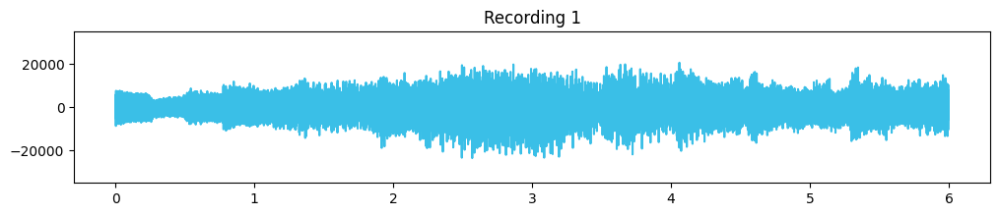

In [ ]:
#y #list of points
x=timing#list of points in time  between 0 and 5,99
plt.figure(figsize=(12,2))
plt.title('Recording 1')
plt.plot(x,signal_1,c="#3ABFE7")
plt.ylim(-35000, 35000)
plt.show()

<ipython-input-47-8e5605b51d84>:4: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  signal_2=np.fromstring(signal_2_raw,'int16')


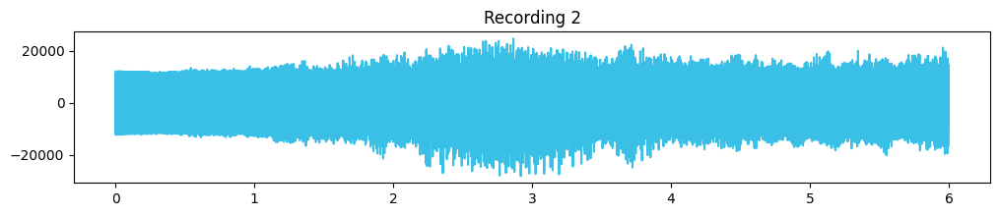

In [ ]:
mix_2_wave=wave.open('ICA mix 2.wav','r')

signal_2_raw=mix_2_wave.readframes(-1)
signal_2=np.fromstring(signal_2_raw,'int16')

plt.figure(figsize=(12,2))
plt.title('Recording 2')
plt.plot(x,signal_2,c="#3ABFE7")
plt.show()

<ipython-input-49-38f6bf4d0c38>:4: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  signal_3=np.fromstring(signal_3_raw,'int16')


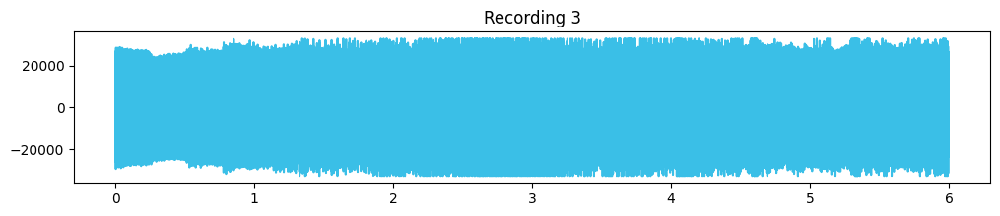

In [ ]:
mix_3_wave=wave.open('ICA mix 3.wav','r')

signal_3_raw=mix_3_wave.readframes(-1)
signal_3=np.fromstring(signal_3_raw,'int16')

plt.figure(figsize=(12,2))
plt.title('Recording 3')
plt.plot(x,signal_3,c="#3ABFE7")
plt.show()

In [ ]:
x=list(zip(signal_1,signal_2,signal_3))
x[:10]

[(879, 157, 879),
 (1268, 899, 2584),
 (1460, 1610, 4081),
 (1756, 2325, 5682),
 (1943, 3022, 7147),
 (2216, 3718, 8689),
 (2407, 4386, 10114),
 (2668, 5056, 11583),
 (2866, 5690, 12954),
 (3106, 6318, 14327)]

In [ ]:
# Convert the list of tuples back into individual signals
signal_1_combined = np.array([sample[0] for sample in x])
signal_2_combined = np.array([sample[1] for sample in x])
signal_3_combined = np.array([sample[2] for sample in x])

# Save the combined signals as a WAV file
output_file_path = '/content/mixed_audio.wav'
write(output_file_path, 44100, np.column_stack((signal_1_combined, signal_2_combined, signal_3_combined)))

# Play the saved audio file
data, samplerate = sf.read(output_file_path)


In [ ]:
Audio('mixed_audio.wav')

In [ ]:
Ica=FastICA(n_components=3)#whiten='arbitrary-variance' (default).
#whiten='unit-variance', the whitening matrix is rescaled to ensure that each recovered source has unit variance.

In [ ]:
x_transformed=Ica.fit_transform(x)

/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


In [ ]:
x_transformed.shape

(264515, 3)

In [ ]:
result_signal_1 = x_transformed[:,0]
result_signal_2 = x_transformed[:,1]
result_signal_3 = x_transformed[:,2]

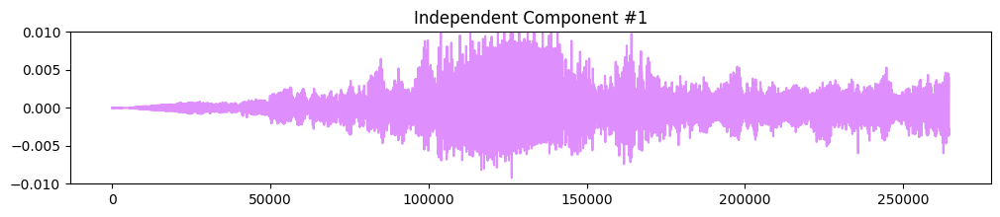

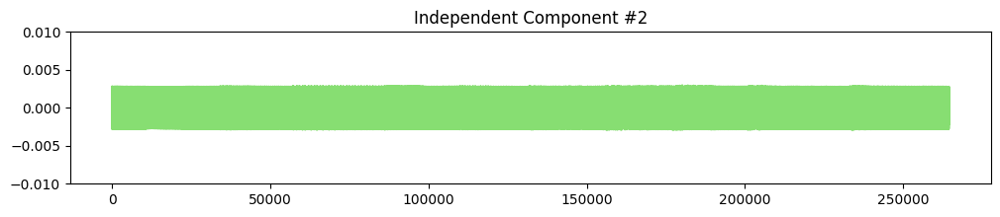

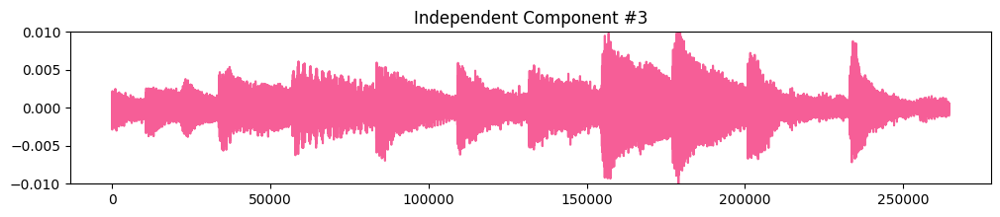

In [ ]:
# Plot Independent Component #1
plt.figure(figsize=(12,2))
plt.title('Independent Component #1')
plt.plot(result_signal_1, c="#df8efd")
plt.ylim(-0.010, 0.010)
plt.show()

# Plot Independent Component #2
plt.figure(figsize=(12,2))
plt.title('Independent Component #2')
plt.plot(result_signal_2, c="#87de72")
plt.ylim(-0.010, 0.010)
plt.show()

# Plot Independent Component #3
plt.figure(figsize=(12,2))
plt.title('Independent Component #3')
plt.plot(result_signal_3, c="#f65e97")
plt.ylim(-0.010, 0.010)
plt.show()

In [ ]:
from scipy.io import wavfile

# Convert to int, map the appropriate range, and increase the volume a little bit
result_signal_1_int = np.int16(result_signal_1*32767*100)
result_signal_2_int = np.int16(result_signal_2*32767*100)
result_signal_3_int = np.int16(result_signal_3*32767*100)


# Write wave files
wavfile.write("result_signal_1.wav", fs, result_signal_1_int)
wavfile.write("result_signal_2.wav", fs, result_signal_2_int)
wavfile.write("result_signal_3.wav", fs, result_signal_3_int)

In [ ]:
Audio('result_signal_1.wav')

In [ ]:
Audio('result_signal_2.wav')

In [ ]:
Audio('result_signal_3.wav')

# **SUCCESSFULLY SEPERATED!!**

Summarizing everything, the project demonstrated the utility of BSS techniques, particularly ICA, in separating mixed audio signals into their constituent sources without prior knowledge of the mixing process. By leveraging the statistical properties of the signals, we were able to effectively recover the original sources, paving the way for various applications in audio processing, speech enhancement, and source localization.

In [ ]:
corr_1 = np.corrcoef(signal_1, x_transformed[:, 0])[0, 1]
corr_2 = np.corrcoef(signal_2, x_transformed[:, 1])[0, 1]

print("Correlation coefficient for Source 1 and ICA Component 1:", corr_1)
print("Correlation coefficient for Source 2 and ICA Component 2:", corr_2)

Correlation coefficient for Source 1 and ICA Component 1: -0.6437576915454182
Correlation coefficient for Source 2 and ICA Component 2: -0.9130735787006985
